In [1]:
# package imports
import gc
import pandas as pd
import numpy as np 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn import metrics

from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.model_selection import train_test_split
sns.set()
import seaborn as sns
pd.options.display.max_columns=100

In [2]:
train=pd.read_csv("https://github.com/ArinB/MSBA-CA-Data/raw/main/CA01/house-price-train.csv")
train.fillna('NaN')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [3]:
train.head().append(train.tail())

C:\Users\41065\AppData\Local\Temp\ipykernel_56672\1356475698.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train.head().append(train.tail())


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,12

In [4]:
print(train.head())

   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   
3   4          70       RL         60.0     9550   Pave   NaN      IR1   
4   5          60       RL         84.0    14260   Pave   NaN      IR1   

  LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
1         Lvl    AllPub       FR2       Gtl      Veenker      Feedr   
2         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
3         Lvl    AllPub    Corner       Gtl      Crawfor       Norm   
4         Lvl    AllPub       FR2       Gtl      NoRidge       Norm   

  Condition2 BldgType HouseStyle  OverallQual  OverallCond  YearBuilt  \
0       Norm     1Fam     2Story            7          

In [5]:
print(train.shape)

(1460, 81)


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
pd.set_option('display.max_rows', None)#I have to know information about all colmuns to estimate features

In [8]:
print(train.dtypes)

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [9]:
#Check missing values and outliers
train.isnull().sum()/len(train)*100 

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [10]:
#there are 3 data futures to filter different types and check data problems as Date, category and numerical value
#Firstly let I to make a date feature dataframe to check probelms
date_cols=['YearBuilt','YearRemodAdd','GarageYrBlt','YrSold']
cate_cols=['MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2',
          'BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation',
          'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual',
          'Functional','FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive','Fence','MiscFeature','SaleType',
          'SaleCondition']
num_cols=['MSSubClass', 'LotFrontage', 'LotArea','OverallQual','OverallCond','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea',
          'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath',
          'FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF',
          'OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold','SalePrice']


In [11]:
datedf=pd.DataFrame()
datedf['count']=train[date_cols].count().values
datedf['missing_rate'] = (train[date_cols].shape[0] - datedf['count']) / train[date_cols].shape[0]
datedf['nunique'] = train[date_cols].nunique().values

datedf.index = date_cols
datedf

,count,missing_rate,nunique
YearBuilt,1460,0.000000,112
YearRemodAdd,1460,0.000000,61
GarageYrBlt,1379,0.055479,97
YrSold,1460,0.000000,5


In [12]:
catedf=pd.DataFrame()
catedf['count']=train[cate_cols].count().values
catedf['missing_rate'] = (train[cate_cols].shape[0] - catedf['count']) / train[cate_cols].shape[0]
catedf['nunique'] = train[cate_cols].nunique().values

catedf.index = cate_cols
catedf

,count,missing_rate,nunique
MSZoning,1460,0.000000,5
Street,1460,0.000000,2
Alley,91,0.937671,2
LotShape,1460,0.000000,4
LandContour,1460,0.000000,4
Utilities,1460,0.000000,2
LotConfig,1460,0.000000,5
LandSlope,1460,0.000000,3
Neighborhood,1460,0.000000,25
Condition1,1460,0.000000,9


In [13]:
numdf=pd.DataFrame()
numdf['count']=train[num_cols].count().values
numdf['missing_rate'] = (train[num_cols].shape[0] - datedf['count']) / train[num_cols].shape[0]
numdf['nunique'] = train[num_cols].nunique().values

numdf.index=num_cols
numdf

,count,missing_rate,nunique
MSSubClass,1460,NaN,15
LotFrontage,1201,NaN,110
LotArea,1460,NaN,1073
OverallQual,1460,NaN,10
OverallCond,1460,NaN,9
OverallCond,1460,NaN,9
YearBuilt,1460,NaN,112
YearRemodAdd,1460,NaN,61
MasVnrArea,1452,NaN,327
BsmtFinSF1,1460,NaN,637


(array([605., 160., 359.,  94.,  52.,  87.,   0.,   0.,  63.,  40.]),
 array([ 20.,  37.,  54.,  71.,  88., 105., 122., 139., 156., 173., 190.]),
 <BarContainer object of 10 artists>)

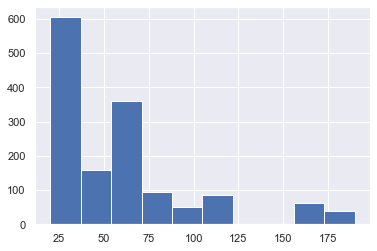

In [14]:
#About the Univariate analysis, visualize the distribution of a numeric column
plt.hist(train['MSSubClass'])
plt.show()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MSSubClass', ylabel='Density'>

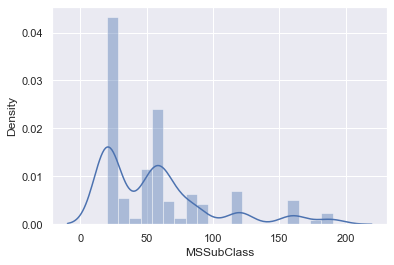

In [15]:
sns.distplot(train['MSSubClass'])

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MSSubClass', ylabel='Density'>

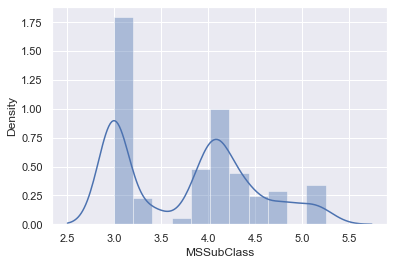

In [16]:
sns.distplot(np.log(train['MSSubClass']))

In [17]:
print(train['MSSubClass'].describe())

count    1460.000000
mean       56.897260
std        42.300571
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64


(array([205., 643., 298.,  40.,   9.,   4.,   0.,   0.,   0.,   2.]),
 array([ 21. ,  50.2,  79.4, 108.6, 137.8, 167. , 196.2, 225.4, 254.6,
        283.8, 313. ]),
 <BarContainer object of 10 artists>)

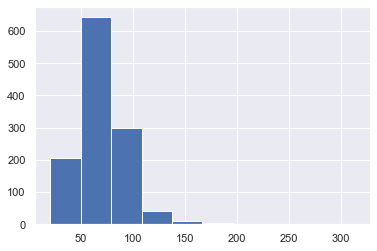

In [18]:
#About the Univariate analysis, visualize the distribution of somenumeric columns
plt.hist(train['LotFrontage'])
plt.show()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

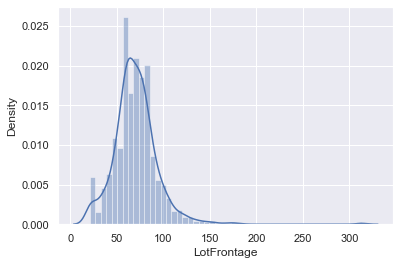

In [19]:
sns.distplot(train['LotFrontage'])

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

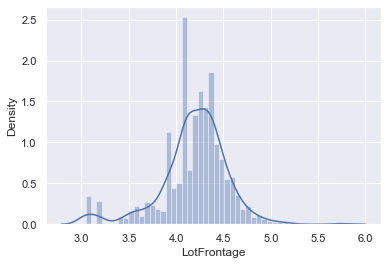

In [20]:
sns.distplot(np.log(train['LotFrontage']))

In [21]:
print(train['LotFrontage'].describe())

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64


(array([1.423e+03, 2.400e+01, 8.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 2.000e+00, 0.000e+00, 1.000e+00]),
 array([  1300. ,  22694.5,  44089. ,  65483.5,  86878. , 108272.5,
        129667. , 151061.5, 172456. , 193850.5, 215245. ]),
 <BarContainer object of 10 artists>)

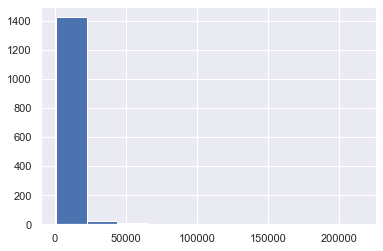

In [22]:
plt.hist(train['LotArea'])
plt.show()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotArea', ylabel='Density'>

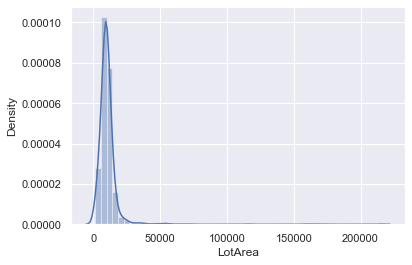

In [23]:
sns.distplot(train['LotArea'])

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='LotArea', ylabel='Density'>

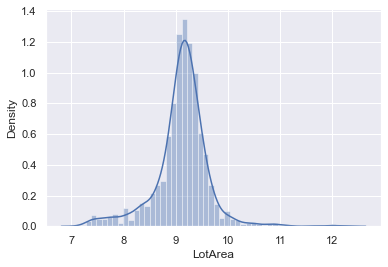

In [24]:
sns.distplot(np.log(train['LotArea']))

In [25]:
print(train['LotArea'].describe())

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64


(array([1.077e+03, 2.190e+02, 9.400e+01, 2.900e+01, 1.900e+01, 6.000e+00,
        4.000e+00, 2.000e+00, 1.000e+00, 1.000e+00]),
 array([   0.,  160.,  320.,  480.,  640.,  800.,  960., 1120., 1280.,
        1440., 1600.]),
 <BarContainer object of 10 artists>)

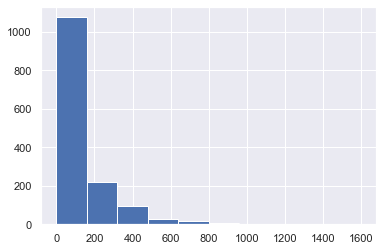

In [26]:
plt.hist(train['MasVnrArea'])
plt.show()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

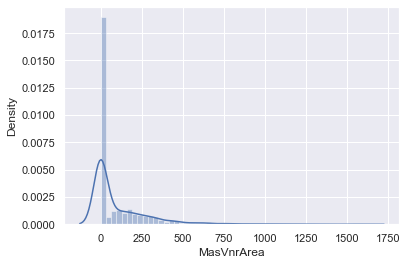

In [27]:
sns.distplot(train['MasVnrArea'])

In [28]:
print(train['MasVnrArea'].describe())

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


(array([148., 723., 373., 135.,  51.,  19.,   4.,   3.,   2.,   2.]),
 array([ 34900., 106910., 178920., 250930., 322940., 394950., 466960.,
        538970., 610980., 682990., 755000.]),
 <BarContainer object of 10 artists>)

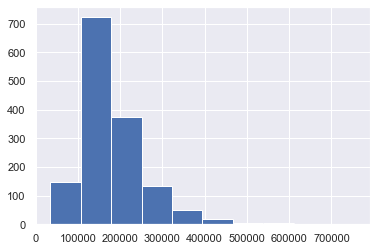

In [29]:
plt.hist(train['SalePrice'])
plt.show()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

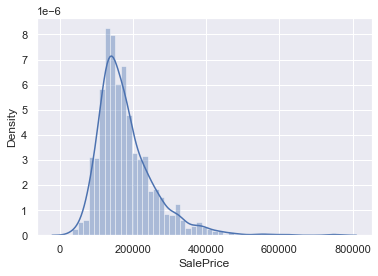

In [30]:
sns.distplot(train['SalePrice'])

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

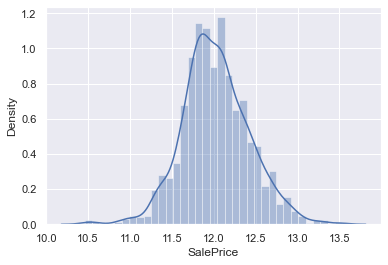

In [31]:
sns.distplot(np.log(train['SalePrice']))

In [32]:
print(train['SalePrice'].describe())

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


(array([445., 726., 154.,   0.,  14.,  37.,   0.,  65.,  11.,   8.]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <BarContainer object of 10 artists>)

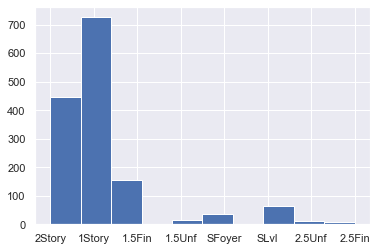

In [33]:
#visualize the distribution of a categorical column
plt.hist(train['HouseStyle'])
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x13ca1a36640>,
 'caps': [<matplotlib.lines.Line2D at 0x13ca1a36bb0>,
 'boxes': [<matplotlib.lines.Line2D at 0x13ca1a36370>],
 'medians': [<matplotlib.lines.Line2D at 0x13ca1a44190>],
 'fliers': [<matplotlib.lines.Line2D at 0x13ca1a44460>],
 'means': []}

Text(0, 0.5, 'MSSubClass')

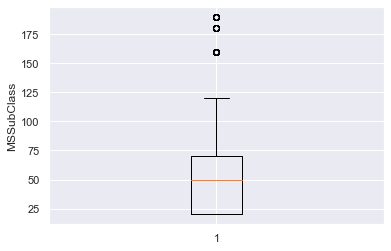

In [34]:
plt.boxplot(train['MSSubClass'])
plt.ylabel('MSSubClass')
plt.show()
#this dataframa has outliers in numeric columns

{'whiskers': [<matplotlib.lines.Line2D at 0x13ca1a94850>,
 'caps': [<matplotlib.lines.Line2D at 0x13ca1a94df0>,
 'boxes': [<matplotlib.lines.Line2D at 0x13ca1a94580>],
 'medians': [<matplotlib.lines.Line2D at 0x13ca1a9f3d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x13ca1a9f6a0>],
 'means': []}

Text(0, 0.5, 'LotArea')

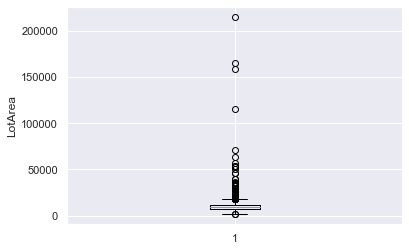

In [35]:
plt.boxplot(train['LotArea'])
plt.ylabel('LotArea')
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x13ca1ae75b0>,
 'caps': [<matplotlib.lines.Line2D at 0x13ca1ae7b50>,
 'boxes': [<matplotlib.lines.Line2D at 0x13ca1ae72e0>],
 'medians': [<matplotlib.lines.Line2D at 0x13ca1af4160>],
 'fliers': [<matplotlib.lines.Line2D at 0x13ca1af4430>],
 'means': []}

Text(0, 0.5, 'SalePrice')

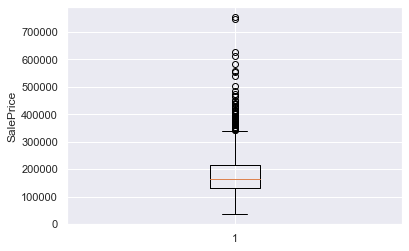

In [36]:
plt.boxplot(train['SalePrice'])
plt.ylabel('SalePrice')
plt.show()

Text(0.5, 0, 'LotFrontage')

Text(0, 0.5, 'SalePrice')

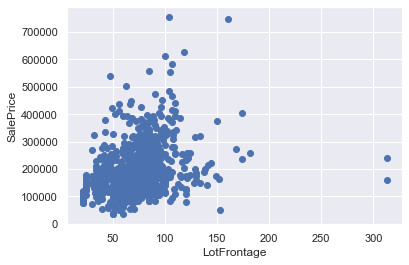

In [37]:
plt.scatter(train['LotFrontage'],train['SalePrice'])
plt.xlabel('LotFrontage')
plt.ylabel('SalePrice')
plt.show() #I can see this plot have good relationship and be in normal distribution

<AxesSubplot:xlabel='LotFrontage', ylabel='SalePrice'>

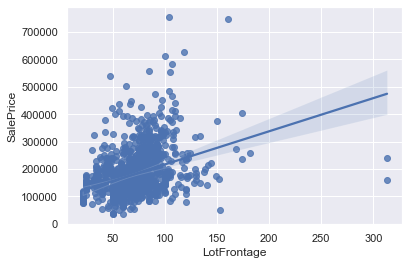

In [38]:
sns.regplot(x='LotFrontage', y='SalePrice', data=train)
plt.show()

<AxesSubplot:xlabel='MSSubClass', ylabel='SalePrice'>

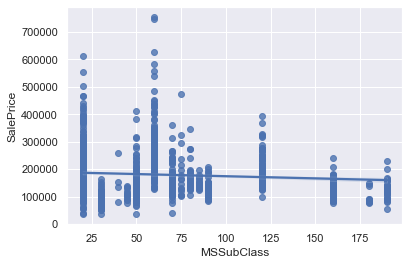

In [39]:
sns.regplot(x='MSSubClass', y='SalePrice', data=train)
plt.show()

<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

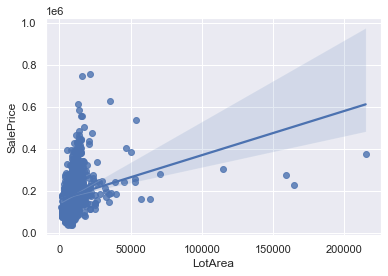

In [40]:
sns.regplot(x='LotArea', y='SalePrice', data=train)
plt.show()# I chose SalePrice to compare other variables and got most variables have correlation, and it also present outliers in these variables

<AxesSubplot:xlabel='LotFrontage', ylabel='MasVnrArea'>

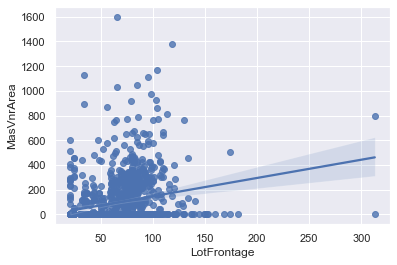

In [41]:
sns.regplot(x='LotFrontage', y='MasVnrArea', data=train)
plt.show()

<AxesSubplot:xlabel='MSSubClass', ylabel='LotFrontage'>

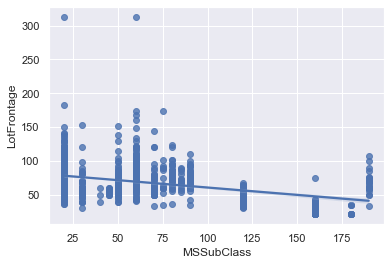

In [42]:
sns.regplot(x='MSSubClass', y='LotFrontage', data=train)
plt.show() #From this plot, I can judge some colmuns are not in normal distribution

In [43]:
pivot_table = train.pivot_table(index=['HouseStyle'],columns=['LotShape'], values=['SalePrice'], aggfunc='mean')
print(pivot_table)

                SalePrice                                        
LotShape              IR1            IR2       IR3            Reg
HouseStyle                                                       
1.5Fin      187980.551724  225478.000000       NaN  130427.114754
1.5Unf       87000.000000            NaN       NaN  111930.769231
1Story      196927.842105  217441.176471  217100.0  162674.573304
2.5Fin      191000.000000  475000.000000       NaN  182333.333333
2.5Unf      160166.666667            NaN       NaN  156300.000000
2Story      236542.627329  249261.700000  214973.0  190461.671815
SFoyer      148396.666667            NaN       NaN  128679.840000
SLvl        167932.333333            NaN       NaN  165650.000000


C:\Users\41065\AppData\Local\Temp\ipykernel_56672\302704648.py:2: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.pcolor(pivot_table, cmap='Reds')


C:\Users\41065\AppData\Local\Temp\ipykernel_56672\302704648.py:3: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


Text(0.5, 0, 'LotShape')

Text(0, 0.5, 'HouseStyle')

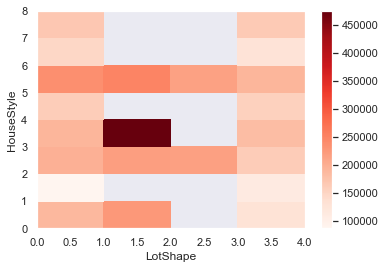

In [44]:
# create a heatmap to visualize the pivot table
plt.pcolor(pivot_table, cmap='Reds')
plt.colorbar()
plt.xlabel('LotShape')
plt.ylabel('HouseStyle')
plt.show()
#Hence, I can judge there are many outliers in this dataframe

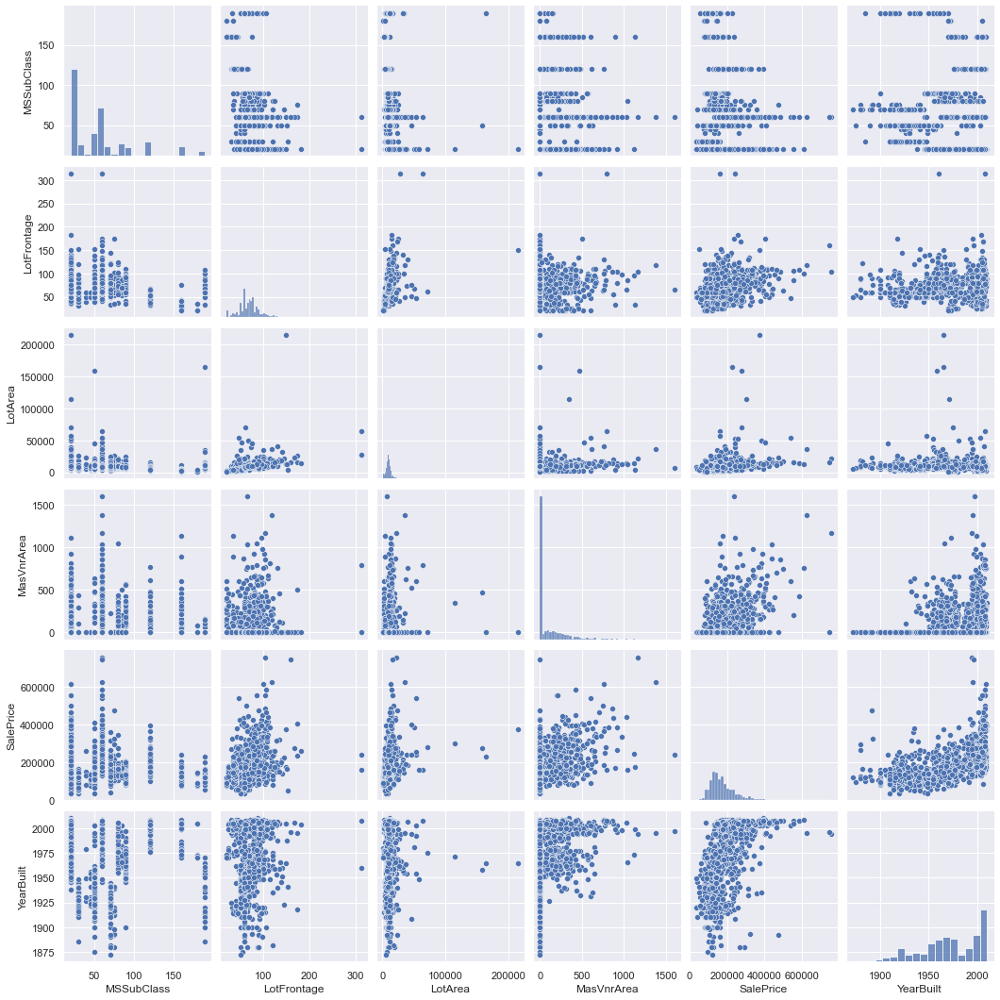

In [45]:
# create a pairplot to visualize the relationships between multiple numeric columns,because there are many columns in the Dataframe, so I choose some variables to be samples
sns.pairplot(train, vars=['MSSubClass', 'LotFrontage','LotArea','MasVnrArea','SalePrice','YearBuilt'])
plt.show()

In [46]:
numsample_col=['MSSubClass', 'LotFrontage','LotArea','MasVnrArea','SalePrice','YearBuilt']

train[numsample_col]


,MSSubClass,LotFrontage,LotArea,MasVnrArea,SalePrice,YearBuilt
0,60,65.0,8450,196.0,208500,2003
1,20,80.0,9600,0.0,181500,1976
2,60,68.0,11250,162.0,223500,2001
3,70,60.0,9550,0.0,140000,1915
4,60,84.0,14260,350.0,250000,2000
5,50,85.0,14115,0.0,143000,1993
6,20,75.0,10084,186.0,307000,2004
7,60,NaN,10382,240.0,200000,1973
8,50,51.0,6120,0.0,129900,1931
9,190,50.0,7420,0.0,118000,1939


In [47]:
correlation = train[numsample_col].corr()
correlation

,MSSubClass,LotFrontage,LotArea,MasVnrArea,SalePrice,YearBuilt
MSSubClass,1.000000,-0.386347,-0.139781,0.022936,-0.084284,0.027850
LotFrontage,-0.386347,1.000000,0.426095,0.193458,0.351799,0.123349
LotArea,-0.139781,0.426095,1.000000,0.104160,0.263843,0.014228
MasVnrArea,0.022936,0.193458,0.104160,1.000000,0.477493,0.315707
SalePrice,-0.084284,0.351799,0.263843,0.477493,1.000000,0.522897
YearBuilt,0.027850,0.123349,0.014228,0.315707,0.522897,1.000000


<Figure size 864x576 with 0 Axes>

<AxesSubplot:>

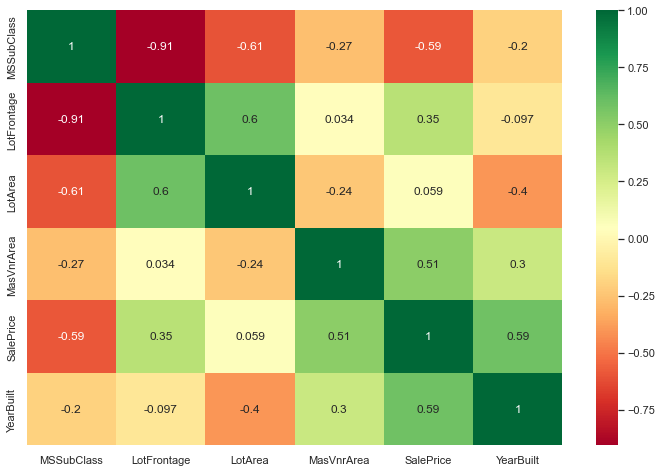

In [48]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlation.corr(), cmap='RdYlGn', annot=True)
plt.show()

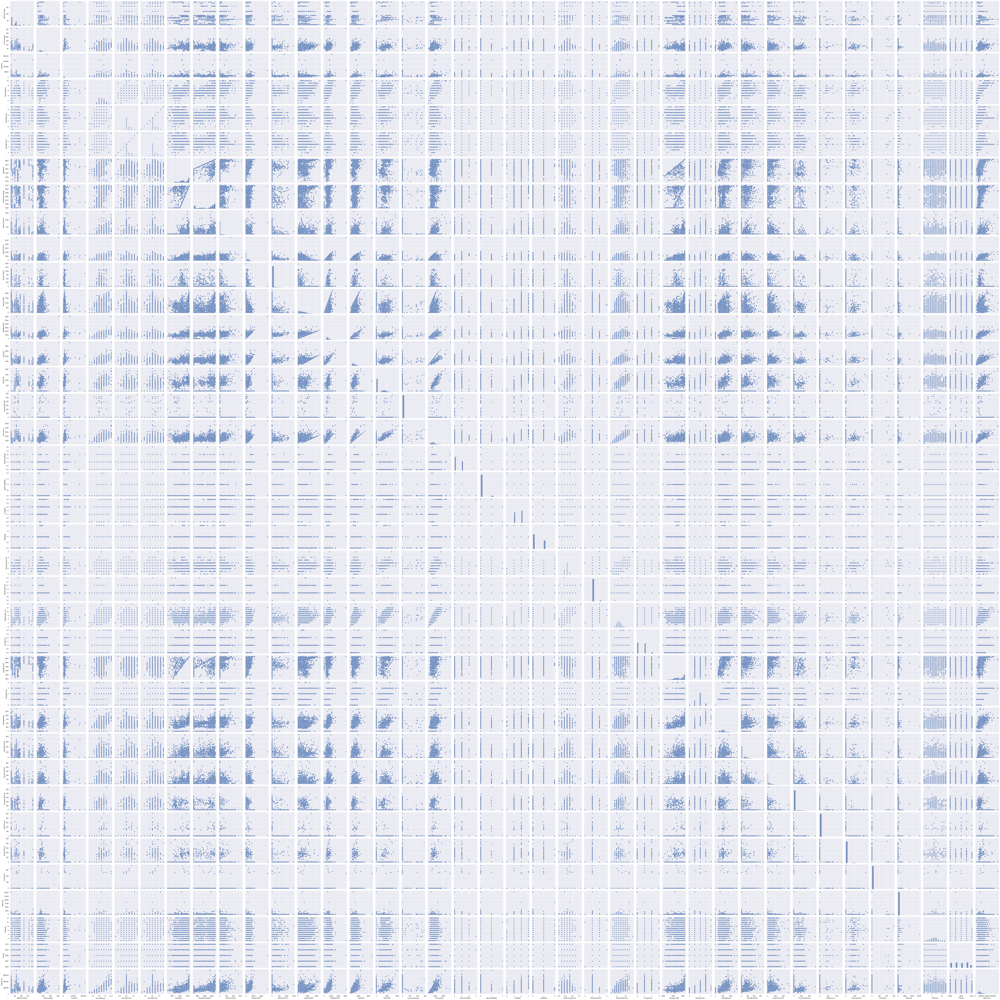

In [49]:
sns.pairplot(train, vars=['MSSubClass', 'LotFrontage', 'LotArea','OverallQual','OverallCond','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea',
                         'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath',
                         'FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF',
                         'OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold','SalePrice'])
plt.show()
#show scatter for all numeric columns

<Figure size 1440x1440 with 0 Axes>

<AxesSubplot:>

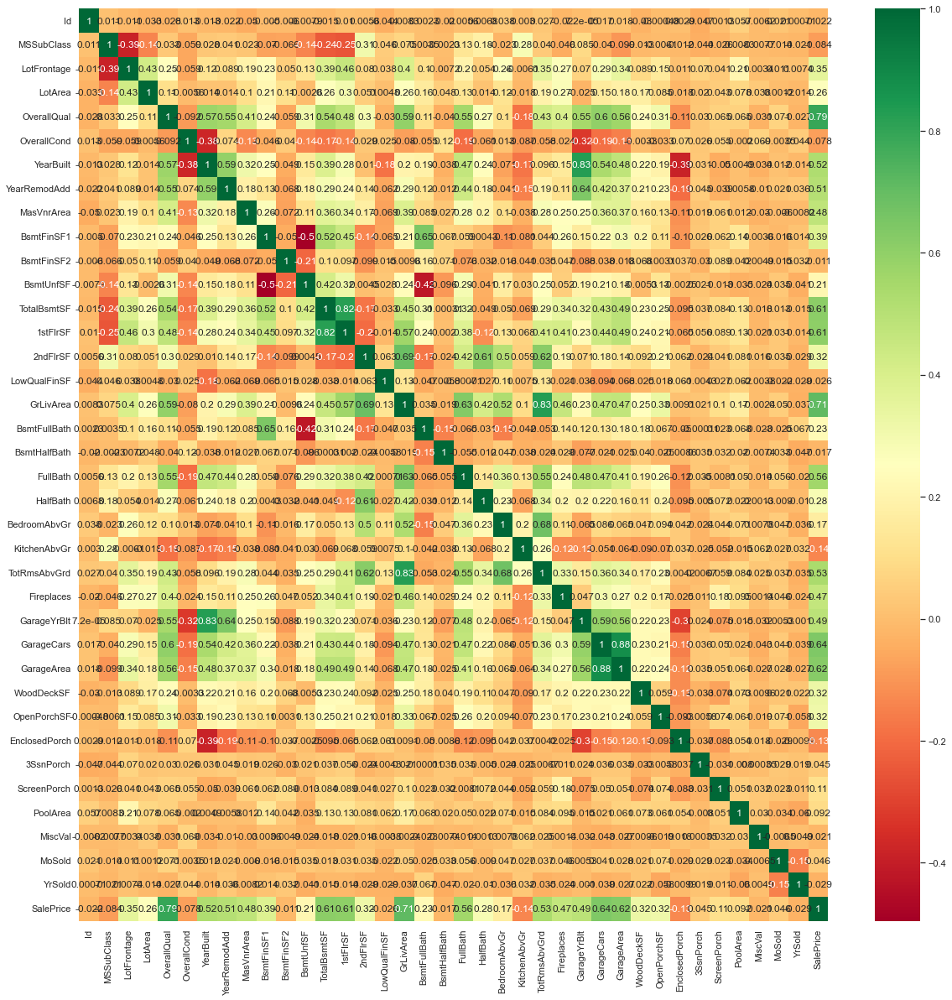

In [79]:
plt.figure(figsize=(20,20))
sns.heatmap(train.corr(), cmap='RdYlGn', annot=True)
plt.show()

In [50]:
train2=train #for test BUG

In [51]:
#Pre_process
train2=train.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1)

In [52]:
train2.isnull().sum()/len(train)*100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
BsmtUnfSF         0.000000
T

In [53]:
LF=train2['LotFrontage'].mean()

In [54]:
train2['LotFrontage'].fillna(train2['LotFrontage'].mean(),inplace=True)

In [55]:
train2.isnull().sum()/len(train)*100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage       0.000000
LotArea           0.000000
Street            0.000000
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
BsmtUnfSF         0.000000
T

In [56]:
#because  Fireplaces is category, I can not use medium or mean to fill the missing value, so I choose to delete this column and orther rows with little missing values
train2=train2.drop(['FireplaceQu',],axis=1)

In [57]:
train2.dropna(axis=0,how='any',inplace=True)

In [58]:
train2.isnull().sum()/len(train)*100 # I celaned all missing values

Id               0.0
MSSubClass       0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
Street           0.0
LotShape         0.0
LandContour      0.0
Utilities        0.0
LotConfig        0.0
LandSlope        0.0
Neighborhood     0.0
Condition1       0.0
Condition2       0.0
BldgType         0.0
HouseStyle       0.0
OverallQual      0.0
OverallCond      0.0
YearBuilt        0.0
YearRemodAdd     0.0
RoofStyle        0.0
RoofMatl         0.0
Exterior1st      0.0
Exterior2nd      0.0
MasVnrType       0.0
MasVnrArea       0.0
ExterQual        0.0
ExterCond        0.0
Foundation       0.0
BsmtQual         0.0
BsmtCond         0.0
BsmtExposure     0.0
BsmtFinType1     0.0
BsmtFinSF1       0.0
BsmtFinType2     0.0
BsmtFinSF2       0.0
BsmtUnfSF        0.0
TotalBsmtSF      0.0
Heating          0.0
HeatingQC        0.0
CentralAir       0.0
Electrical       0.0
1stFlrSF         0.0
2ndFlrSF         0.0
LowQualFinSF     0.0
GrLivArea        0.0
BsmtFullBath     0.0
BsmtHalfBath 

In [59]:
train2.duplicated() #There is no duplicate values

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71      False
72      False
73      False
74    

In [60]:
numsample_col1=['MSSubClass', 'LotFrontage','LotArea','MasVnrArea','SalePrice','YearBuilt']

train2[numsample_col1].describe()

,MSSubClass,LotFrontage,LotArea,MasVnrArea,SalePrice,YearBuilt
count,1338.000000,1338.000000,1338.000000,1338.000000,1338.000000,1338.000000
mean,56.136024,70.630187,10706.294469,110.360239,186761.782511,1973.029148
std,41.252576,22.161578,10336.621126,185.604816,78913.847668,29.563540
min,20.000000,21.000000,1300.000000,0.000000,35311.000000,1880.000000
25%,20.000000,60.000000,7744.000000,0.000000,135000.000000,1956.000000
50%,50.000000,70.049958,9600.000000,0.000000,168500.000000,1976.000000
75%,70.000000,80.000000,11760.750000,174.000000,220000.000000,2001.000000
max,190.000000,313.000000,215245.000000,1600.000000,755000.000000,2010.000000


In [61]:
# I will fix outliers by all plots and the comparison among max, 75% and min
train2=train2.drop(train2[train2['MSSubClass']>150].index)

In [62]:
train2=train2.drop(train2[train2['LotFrontage']>200].index)

In [63]:
train2=train2.drop(train2[train2['LotArea']>70000].index)

In [64]:
train2=train2.drop(train2[train2['MasVnrArea']>1200].index) 

In [65]:
train2=train2.drop(train2[train2['SalePrice']>650000].index)#YearBuilt has no outliers, so I don't need to clean them

In [66]:
train2[numsample_col1].describe()

,MSSubClass,LotFrontage,LotArea,MasVnrArea,SalePrice,YearBuilt
count,1240.000000,1240.000000,1240.000000,1240.000000,1240.000000,1240.000000
mean,48.266129,72.083541,10480.333871,105.460484,188590.508065,1972.854032
std,29.342020,18.039405,5026.970522,172.034017,75714.693445,29.581894
min,20.000000,30.000000,2500.000000,0.000000,35311.000000,1880.000000
25%,20.000000,60.000000,8063.750000,0.000000,136500.000000,1955.000000
50%,50.000000,70.049958,9644.000000,0.000000,172500.000000,1976.000000
75%,60.000000,80.000000,11844.500000,172.000000,223625.000000,2001.000000
max,120.000000,182.000000,57200.000000,1115.000000,611657.000000,2010.000000


In [67]:
correlation1 = train2[numsample_col1].corr()
correlation1

,MSSubClass,LotFrontage,LotArea,MasVnrArea,SalePrice,YearBuilt
MSSubClass,1.000000,-0.223540,-0.181151,0.027512,0.065919,0.092781
LotFrontage,-0.223540,1.000000,0.320612,0.237065,0.305028,0.172388
LotArea,-0.181151,0.320612,1.000000,0.160832,0.331844,0.045360
MasVnrArea,0.027512,0.237065,0.160832,1.000000,0.494325,0.310682
SalePrice,0.065919,0.305028,0.331844,0.494325,1.000000,0.546747
YearBuilt,0.092781,0.172388,0.045360,0.310682,0.546747,1.000000


<Figure size 864x576 with 0 Axes>

<AxesSubplot:>

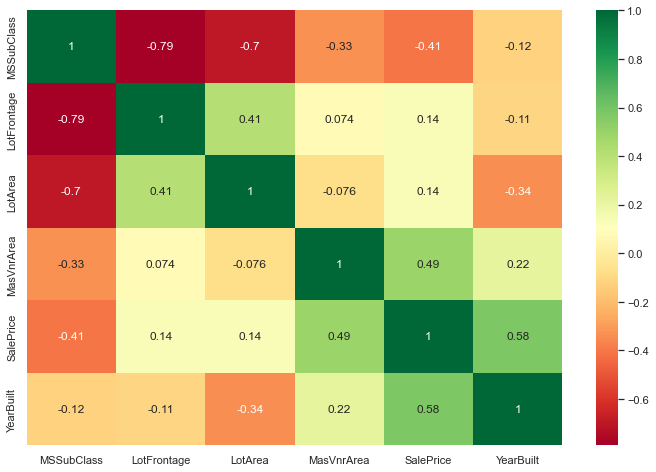

In [68]:
#Part 3 Post-processing and comparsion
plt.figure(figsize=(12, 8))
sns.heatmap(correlation1.corr(), cmap='RdYlGn', annot=True)
plt.show()

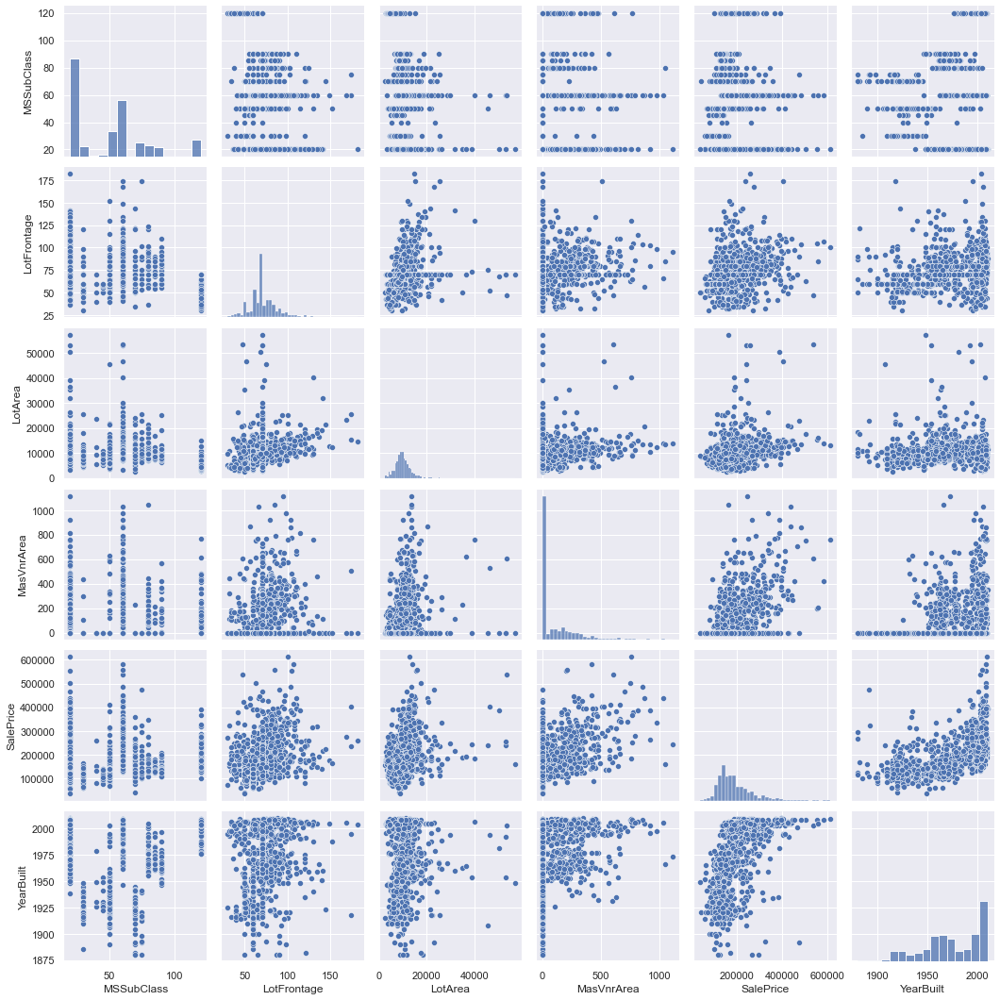

In [69]:
sns.pairplot(train2, vars=['MSSubClass', 'LotFrontage','LotArea','MasVnrArea','SalePrice','YearBuilt'])
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x13cf39e0250>,
 'caps': [<matplotlib.lines.Line2D at 0x13cf39e07f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x13cf39c9f40>],
 'medians': [<matplotlib.lines.Line2D at 0x13cf39e0d90>],
 'fliers': [<matplotlib.lines.Line2D at 0x13cf39ec0a0>],
 'means': []}

Text(0, 0.5, 'MSSubClass')

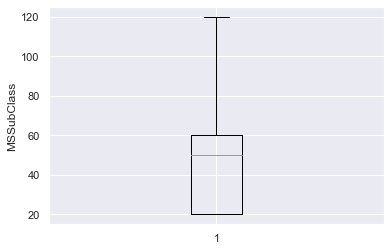

In [70]:
plt.boxplot(train2['MSSubClass'])
plt.ylabel('MSSubClass')
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x13cf3e94b20>,
 'caps': [<matplotlib.lines.Line2D at 0x13cf3ea4100>,
 'boxes': [<matplotlib.lines.Line2D at 0x13cf3e94940>],
 'medians': [<matplotlib.lines.Line2D at 0x13cf3ea46a0>],
 'fliers': [<matplotlib.lines.Line2D at 0x13cf3ea4970>],
 'means': []}

Text(0, 0.5, 'LotArea')

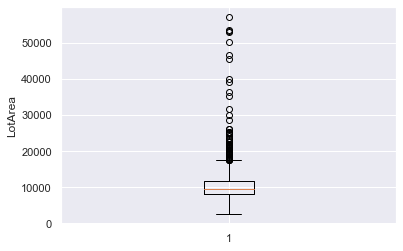

In [71]:
plt.boxplot(train2['LotArea'])
plt.ylabel('LotArea')
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x13cf3ef3ca0>,
 'caps': [<matplotlib.lines.Line2D at 0x13cf3f03280>,
 'boxes': [<matplotlib.lines.Line2D at 0x13cf3ef39d0>],
 'medians': [<matplotlib.lines.Line2D at 0x13cf3f03820>],
 'fliers': [<matplotlib.lines.Line2D at 0x13cf3f03af0>],
 'means': []}

Text(0, 0.5, 'SalePrice')

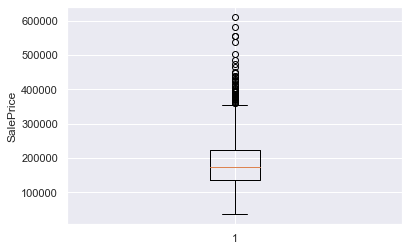

In [72]:
plt.boxplot(train2['SalePrice'])
plt.ylabel('SalePrice')
plt.show()

<AxesSubplot:xlabel='LotFrontage', ylabel='SalePrice'>

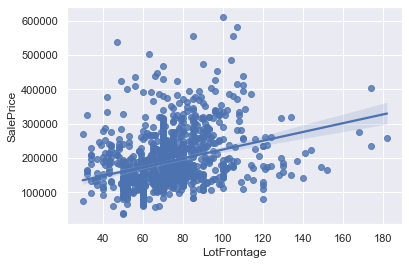

In [73]:
sns.regplot(x='LotFrontage', y='SalePrice', data=train2)
plt.show()

<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

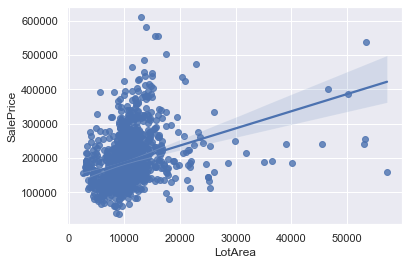

In [74]:
sns.regplot(x='LotArea', y='SalePrice', data=train2)
plt.show()

<AxesSubplot:xlabel='LotFrontage', ylabel='MasVnrArea'>

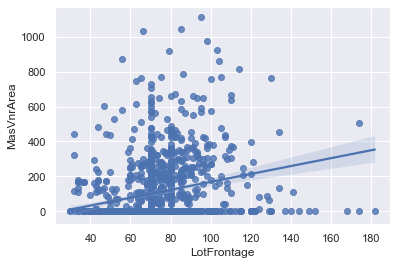

In [75]:
sns.regplot(x='LotFrontage', y='MasVnrArea', data=train2)
plt.show()

In [76]:
#After pre-process, I have cleaned outliers; these plots could show samples of these columns that have become more normal and have been in nornal distribution, and that still have a clear linear relationship